# Visible Broadband Imager at DKIST
## Some data examples

To learn more about the instrument please refer to: https://link.springer.com/article/10.1007/s11207-021-01881-7

The VBI data used in this tutorial is stored into the same folder named 'VBI/data', and a subfolder named 'results' needs to be created in the 'notebook' folder. Or, you can adjust the paths leading to data and/or results as it works better for you.

To find more information on how to retrieve VBI data from the DKIST Data Center please refer to the dkist tools tutorials:
https://docs.dkist.nso.edu/projects/python-tools/en/latest/tutorial/5_downloading_data.html

To run this notebook the dkist module and jupyter need to be installed.

Please create a new conda environment. In this case we name it dkist-vbi.¶
conda create -n dkist-vbi

conda activate dkist-vbi

and install:
conda install -c conda-forge dkist jupyter

In case you do not have the ffmpeg library installed please also do:
conda install -c conda-forge ffmpeg

Please note that this short tutorial is a quick look guide to get a first expression of VBI data and explain possible issues encountered. It is not part of the official DKIST tools.

Please note that this short tutorial is a quick look guide to get a first impression of VBI data and explain possible issues encountered. It is not part of the official DKIST tools. 


### Improving the image quality
 
<img src="images_tutorial/wavefront_deformation.png" alt="Drawing" style="width: 800px;"/>

- Correct the distorted wavefront/images using: Adaptive Optics – Active correction
- Speckle Reconstruction – Passive correction

  -  Take images very fast (exposure times of few ms) (seeing frozen within an image)
     -   80 short-exposed frames are acquired within 2.67 seconds (at 30 Hz)  
     -   The Sun remains unchanged over that period (assumption) 
  -  Any changes in the images are attributed to seeing (wavefront aberrations)
  -  These 80 images are “consumed” to derive the seeing and used for restoration
$\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;$  Raw (AO corrected)       $\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;$ Reconstructed
<img src="images_tutorial/raw_vs_speckled.png" alt="Drawing" style="width: 800px;"/>


# VBI level 1 data
Instructions for downloading data through Globus and using the DKIST tools can be found here: https://docs.dkist.nso.edu/projects/python-tools/en/latest/tutorial/5_downloading_data.html

For this tutorial we follow the DKIST tool tutorial to gain information on the avaiable files. However, we have already provided the necessary data via the Dropbox link(s).

Let's start: we search for VBI data that was taken during the Director's Discretionary Time on October 16, 2023 and publicly available:

In [1]:
import astropy.units as u
import matplotlib.pyplot as plt
from sunpy.net import Fido, attrs as a
import dkist.net
from astropy.io import fits
Fido.search(a.Time("2023-10-16 10:50:00", "2023-10-16 19:53:00")   & a.Instrument("VBI") & a.dkist.Embargoed(False))

Start Time,End Time,Instrument,Wavelength,Bounding Box,Dataset ID,Dataset Size,Exposure Time,Primary Experiment ID,Primary Proposal ID,Stokes Parameters,Target Types,Number of Frames,Average Fried Parameter,Embargoed,Downloadable,Has Spectral Axis,Has Temporal Axis,Average Spectral Sampling,Average Spatial Sampling,Average Temporal Sampling,status
,,,nm,,,Gibyte,s,,,,,,,,,,,nm,arcsec,s,
Time,Time,str3,float64[2],str32,str5,float64,float64,str9,str9,str1,str7[1],int64,float64,bool,bool,bool,bool,float64,float64,float64,str6
2023-10-16T18:16:13.360,2023-10-16T18:19:52.720,VBI,450.0 .. 450.0,"(-146.45,139.83),(-262.68,21)",AZYQR,0.0,0.301,eid_2_114,pid_2_114,I,sunspot,27,0.07432360035170049,False,True,False,True,nan,0.010098433122038841,109.67999999998952,ACTIVE
2023-10-16T18:16:40.782,2023-10-16T18:18:30.462,VBI,486.0 .. 486.0,"(-146.45,139.83),(-262.68,21)",BDDXM,0.0,3.4909999999999997,eid_2_114,pid_2_114,I,sunspot,18,0.08312459556201757,False,True,False,True,nan,0.010098433122038841,109.6800000000087,ACTIVE
2023-10-16T18:45:19.360,2023-10-16T18:48:58.720,VBI,450.0 .. 450.0,"(-105.54,140.06),(-221.72,21.24)",AJQWW,0.0,0.301,eid_2_114,pid_2_114,I,sunspot,27,0.10735269164860524,False,True,False,True,nan,0.010098433122038841,109.67999899999903,ACTIVE
2023-10-16T18:15:45.953,2023-10-16T18:19:25.313,VBI,393.0 .. 393.0,"(-146.45,139.83),(-262.68,21)",AXYOP,0.0,25.007,eid_2_114,pid_2_114,I,sunspot,27,0.08007350900109349,False,True,False,True,nan,0.010098433122038841,109.67999899999903,ACTIVE
2023-10-16T18:15:18.520,2023-10-16T18:18:57.880,VBI,430.0 .. 430.0,"(-146.45,139.83),(-262.68,21)",AYYPZ,0.0,0.6970000000000001,eid_2_114,pid_2_114,I,sunspot,27,0.08613854387726781,False,True,False,True,nan,0.010098433122038841,109.67999899999903,ACTIVE
2023-10-16T19:37:47.782,2023-10-16T19:41:27.142,VBI,486.0 .. 486.0,"(-57.14,140.06),(-173.28,21.24)",AOJWX,0.0,3.4909999999999997,eid_2_114,pid_2_114,I,sunspot,27,0.04185259303760415,False,True,False,True,nan,0.010098433122038841,109.6800009999992,ACTIVE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-10-16T19:06:24.106,2023-10-16T19:26:12.506,VBI,393.0 .. 393.0,"(-141.76,102.97),(-185.5,58.33)",BKPJD,0.0,25.007,eid_2_114,pid_2_114,I,sunspot,61,0.06484553650690333,False,True,False,True,nan,0.010098433122038841,594.2000007540993,ACTIVE


There are 3 VBI channels that acquired data at that time (CaII K; Hbeta; G-band). We select the G-band (430.5nm) channel data set BRLPJ and retrieve some information on filesizes and the time sequence.

In [9]:
#res = Fido.search(a.dkist.Dataset("BRLPJ"))
#files = Fido.fetch(res)

In [10]:
ds = dkist.load_dataset("/Users/dato/NSO/GST_workshop/data/VBI/BRLPJ/")

We now read in a single fits file and display both image and header:

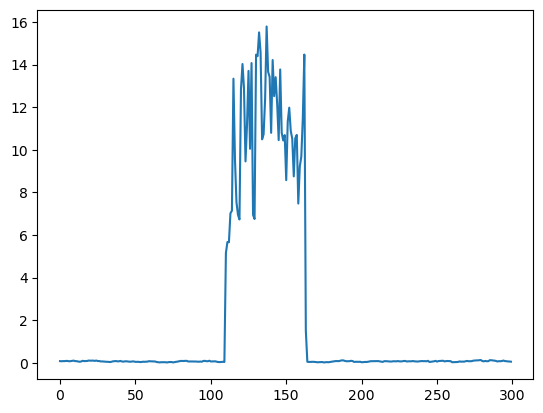

In [11]:
plt.plot(ds[0:300].headers['ATMOS_R0'])

In [12]:
data_dir='/Users/dato/NSO/GST_workshop/data/VBI/BRLPJ/'

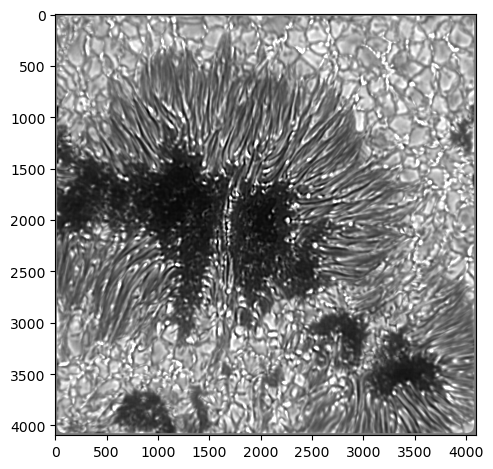

In [13]:
#Read in another  VBI level1 file. 
hdu_list = fits.open(data_dir+'VBI_2023_10_16T20_18_48_806_00430500_I_BRLPJ_L1.fits')
img=hdu_list[1].data[0,:,:]


#display
fig, axes = plt.subplots(nrows=1, ncols=1,tight_layout=True)
axes.imshow(img,cmap="gray",vmax=60000,vmin=1000) 
#axes[1].imshow(image3,cmap="gray",vmax=45000,vmin=20000) 
#axes[2].imshow(image,cmap="gray",vmax=80000,vmin=5000)
plt.show()

Note that the image is displayed in the native pixels scale. Let's look for some further info 

In [14]:
hdu_list.info()

Filename: /Users/dato/NSO/GST_workshop/data/VBI/BRLPJ/VBI_2023_10_16T20_18_48_806_00430500_I_BRLPJ_L1.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       6   ()      
  1  observation    1 CompImageHDU    287   (4096, 4096, 1)   float32   


In [15]:
hdu_list[1].header

XTENSION= 'IMAGE   '                                                            
BITPIX  =                  -32                                                  
NAXIS   =                    3                                                  
NAXIS1  =                 4096 / [pix]                                          
NAXIS2  =                 4096 / [pix]                                          
NAXIS3  =                    1 / [pix]                                          
PCOUNT  =                    0                                                  
GCOUNT  =                    1                                                  
BUNIT   = 'ct      '                                                            
DATE    = '2024-03-01T20:31:04.847'                                             
DATE-BEG= '2023-10-16T20:18:48.806'                                             
DATE-END= '2023-10-16T20:18:48.806697'                                          
TELAPSE = 0.0006971647962927

Some things to note: the two dimensions (x,y) of the image are BOTH spatial - vs. the (spatial, spectral) of ViSP or Cryo; the CDELT1  and CDELT2
keywords give the pixel spatial scale (= 0.01009 arcsec in this case); this value is wavelength dependent! (this is why the FOV of VBI red is so much bigger than for VBI blue

A document describing all the fits header keywords is here:
https://docs.dkist.nso.edu/projects/data-products/en/v3.0.0/specs/spec-214.html#spec-214 

#### Same FOV, other wavelengths

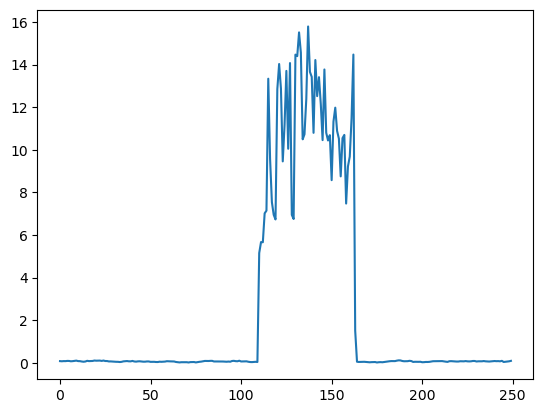

In [16]:
plt.plot(ds[0:250].headers['ATMOS_R0'])

#### Destretching a time sequence 

On-disk DKIST observations use the Adaptive Optics system, which corrects for aberrations introduced by atmospheric seeing. Still, there are residual distortions, especially when considering a time sequence, and these need to be taken care post-acquisition (and speckle reconstruction). We now take a look at this effect and a way to correct for it. Let us first load the data as a full DKIST data set from the local folder and plot the first frame (the same as before):

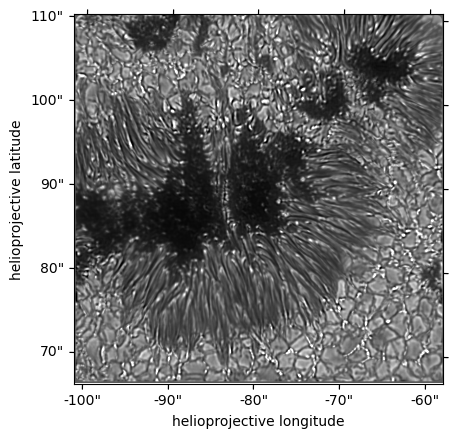

In [17]:
import matplotlib.pyplot as plt
ds[0,:,:].plot(cmap="gray",vmax=80000,vmin=1000)
plt.show()


In [18]:
ds.data

dask.array<reshape, shape=(307, 4096, 4096), dtype=float32, chunksize=(1, 4096, 4096), chunktype=numpy.ndarray>

(Note that by using the ds[].plot now the x,y axis are actual helioprojective coordinates! And just so you know....  they can still 
be a few arcsec off, both due to the telescope pointing, and to possible offsets between that and the center of the FOV of single instruments)

Next we create a dataCube of the sequence (only the first 100) and prepare a movie for a sub-portion of the FOV

In [39]:
from astropy.io import fits
import numpy as np

#create fits cube. 100 times, 2000 x 2000 pixels

dataCube=[]
loc_files=ds.files.filenames[0:100]

for i in range(len(loc_files)):
   dataCube.append(fits.open(data_dir+loc_files[i])[1].data[0,601:2600,1201:3200])
dataCube=np.asarray(dataCube)

#save pre-destretch data cube of the first 100 (sub-)frames
fits.writeto("./results/pre-destretch_dataCube.fits",dataCube,overwrite=True)


In [41]:
import utilvbi
from astropy.io import fits
import numpy as np

#restore datacube
dataCube=fits.open("./results/pre-destretch_dataCube.fits")[0].data

#make a movie 
utilvbi.storeSequence(dataCube,"./results/pre-destretch_shortGband.mp4", dpi=300, write=True)

When playing this movie one can notice a "image wobble" with locally shifted subfields. (The cadence of these data is a not constant: 5 images with Delta t  ~ 3 s; then a 9 s jump; repeat)

In [26]:
from IPython.display import Video
Video("./results/pre-destretch_shortGband.mp4", embed=True, width=600, height=600)

No destretch is performed in the VBI L1 pipeline; we will use here a postprocessing destretch code written by Friedrich Woeger and made available at:  https://bitbucket.org/dkist-community-code/destretch/src/main/. 
A version is included in this notebook folder. 
Note that this code is not yet an official DKIST tool release, and is open for improvement by users. Please contact F.Woeger(NSO) for suggestions.

#### Parameters

tileSizeInput: size vector for destretching ; this sets the subfield sizes used sequentially for the subfield crosscorrelation, in the example below we chose four sizes, from 128 to 24 (pixels)

rMean: is used to detrend the shift vectors by creating a running mean over the input cube as reference

globalTrack: aligns the full images on top of each other (coarse alignment); a subimage of size 256 near the center of the 4096 times 4096 pixel image is used to find the shifts

##### This might take a while to run.
Be aware that the message will run several times (depending on the size vector specified) with the output message: "Image X of 100...". Please check if the fits file "./results/postdestretch_dataCube.fits" has been created before moving on and the in-process star for the cell has changed to a number.


In [44]:
import destretch_fw as destr
import utilvbi 
from astropy.io import fits
import numpy as np
#restore datacube
dataCube=fits.open("./results/pre-destretch_dataCube.fits")[0].data

#destretch
tileSizeInput = [128, 64, 48, 24]  
dataCubeTracked = destr.destretchSeq(dataCube, tileSizeInput, rMean=3, globalTrack=None) 
#save as Tracked datacube 
fits.writeto("./results/postdestretch_dataCube.fits",dataCubeTracked,overwrite=True)

(Note: it took 8 min and 4 iterations to do the 2000x2000x100 file)

In [45]:
#make the video
import utilvbi
#restore tracked datacube
dataCubeTracked=fits.open("./results/postdestretch_dataCube.fits")[0].data

utilvbi.storeSequence(dataCubeTracked,"./results/postdestretch_shortGband.mp4", dpi=300, write=True)

After the destretch the "image wobble" has improved:

In [46]:
from IPython.display import Video
Video("./results/postdestretch_shortGband.mp4", embed=True, width=600, height=600)

### Histogram matching

Images in a sequence might have overall intensity variations due to various causes, from the simple rising of the Sun in the sky during the morning, to variation of sky transparency (clouds), etc. It can be advantageous for your analysis to make sure that the intensities compare. One of the ways to do this is "histogram matching", available in the skimage package.  Let's pick the first frame as a reference frame:

In [47]:
import astropy.io.fits as pf
import utilvbi
import skimage
from skimage.exposure import match_histograms
from IPython.display import Video

#restore tracked datacube
dataCubeTracked=fits.open("./results/postdestretch_dataCube.fits")[0].data

gbref=dataCubeTracked[0,:,:] #choosing here the first image as a reference
timegb,yy,xx=dataCubeTracked.shape
   
dataCubeTrackedhist=[]
for idata in range(timegb):
 image=dataCubeTracked[idata,:,:]
 matched = match_histograms(image, gbref)
 dataCubeTrackedhist.append(matched)
   
dataCubeTrackedhist=np.asarray(dataCubeTrackedhist)
    
#save result and movie  
fits.writeto("./results/postdestretch_histomatch_dataCube.fits",dataCubeTrackedhist,overwrite=True)#save movie
utilvbi.storeSequence(dataCubeTrackedhist,"./results/postdestretch_histomatch_shortGband.mp4", dpi=300, write=True)

In [48]:
#play movie
Video("./results/postdestretch_histomatch_shortGband.mp4", embed=True, width=600, height=600)

### Examples for data quality issues
In this section we would like to point out some issues that can be encountered within the VBI images. Most of these are more noticeable when the data has been acquired during bad seeing stretches.

#### Noise at intensity gradients
The VBI cameras have been operating in a three-level gain mode. Depending on the charge accumulated in a pixel, a different gain is applied for that pixel. For this reason, each individual pixel exhibits a different noise profile that is amplified by the speckle reconstruction process. At locations where there are strong gradients in intensity (e.g., gradient from the low intensity umbra to the brighter surrounding) this is particularly noticeable. An example seen in a Ca II K image is shown here:

<img src="./images_tutorial/grad_camera.png" alt="Drawing" style="width: 400px;"/>

#### Vertical Stripes
Due to camera noise patterns one can see sometimes vertical or horizontal stripes which have been picked up by the reconstruction and amplified. The most visible stripes appear at intervals of roughly 172 pixel in x-direction. These pattern are most clear when the burst was recorded during a bad seeing instance.
We plot an example of an image in bad seeing taken with the Ca II K filter, and when zoomin in (run second cell) the stripe pattern becomes visible.

#### Flat fielding issues

In some cases the flat fielding procedure does not take out all distortions introduced in the optical path (e.g. dust on optical elements). This is most visible during periods of bad seeing. An unfortunate misalignment during observing between the flat field data and the science data can also be responsible for flat field artefacts. See following examples in an H-beta image.

#### Repetetive noise pattern
In the previous image one can also see a repetative noise pattern. This can occur when the tile noise filter passes high frequency noise.

<img src="images_tutorial/windownoise.png" alt="Drawing" style="width: 500px;"/>

#### Overexposed pixel

The observing resident scientists adjust the exposure times during observations as the light level changes (changes during the day and seasons). Before the overexposure is adjusted there can be several frames showing saturated pixels. This is seen in the high intensity pixels such as within bright granules or bright points. Example:

#### Pointing drifts

In rare cases one can notice a drift of the observed Field of View. The cause is still being investigated. 


### Mosaics
The VBI can also take data in mosaic mode. The images below display how the VBI camera is moved in several positions to cover the full DKIST FOV of 2.8' diameter (the square inscribed). The blue channel requires 9 separate "tiles"; the red channel would need only 4, but a 5th tile is acquired at the center for flat fielding reasons. 

#### The relevant keywords in the header to find out in which mode VBI was spatially sampling are VBISTPAT, VBINSTP, and VBISTP ("pattern"; "number steps", and "current step"). 

A typical VBI Blue mosaic would have VBINSTP = 9 as it has moved through all field samples. The spatial pattern (the way the FOV is mosaicked) would be described in VBISPAT. For the pattern shown in the figure below this would be [5,8,9,6,3,2,1,4,7]. Then for the individual fits files the keyword VBISTP would change depending on which field is currently recorded. Going back to the pattern as shown below, the first file would be of the centerfield (field sample 5). The VBISTP keyword in this case would be VBISTP = 1. Therefore we need to check the first index in VBISPAT, which is 5.   

These images courtesy of Andy Beard (NSO) show the spatial field samples and the arrows indicate one possible spatial pattern for the observing sequence.


<img src="images_tutorial/mosaicsam.png" alt="Drawing" style="width: 800px;"/>

For data sets which were recorded as mosaics the DKIST tools provides within its 'How To' pages a tutorial on how to stitch together a mosaic using the reproject module: https://docs.dkist.nso.edu/projects/python-tools/en/stable/howto_guides/reproject_vbi_mosaic.html


In the header of the G-band fits file we read at the beginning and for which we have printed the header, VBINSTP = 1. Therefore the number of spatial steps indicates that only one of the 9 field samples was collected with the VBI Blue camera. The field sample recorded was spatial step pattern VBISTPAT = 5.  
We therefore have a timesequence of the centerfield. 

#### Field obstruction

In some cases the 2.8' field stop is visible within one of the field samples (at the edge of a mosaic).
Example of field sample 9 in a mosaic:  